# Final Project: ToMe for Stable Diffusion

## Section: Environment Setup

In [1]:
# Create environment

In [2]:
# Clone Stable Diffusion Repo
!git clone https://github.com/Stability-AI/stablediffusion.git
!mv stablediffusion/* .
!rm -rf stablediffusion

In [3]:
# Install Stable Diffusion
!pip install -r requirements.txt

In [4]:
!pip install torchtext==0.6 intel_extension_for_pytorch ipywidgets tomesd matplotlib

In [5]:
# Download checkpoint file for Stable Diffusion
!chmod -R 0775 checkpoints/
# uncomment below checkpoint to also use 768 version
# !wget -P checkpoints/ https://huggingface.co/stabilityai/stable-diffusion-2/resolve/main/768-v-ema.ckpt
!wget -P checkpoints/ https://huggingface.co/stabilityai/stable-diffusion-2-base/resolve/main/512-base-ema.ckpt

In [6]:
# # Getting metadata file used for Stable Diffusion testing containing list of prompts
!wget https://huggingface.co/datasets/poloclub/diffusiondb/resolve/main/metadata.parquet
!mv metadata.parquet prompts_metadata.parquet

In [7]:
# installing spacy for some text analysis of prompts
!pip install -U wheel
!pip install spacy
!python3 -m spacy download en_core_web_lg

## Section: Imports

In [8]:
from time import time
import os
# import cv2
import torch
import numpy as np
import pandas as pd
from omegaconf import OmegaConf
from PIL import Image
from tqdm import tqdm, trange
from itertools import islice
from einops import rearrange
from torchvision.utils import make_grid
from pytorch_lightning import seed_everything
from torch import autocast
from contextlib import nullcontext
from imwatermark import WatermarkEncoder
from copy import deepcopy

from ldm.util import instantiate_from_config
from ldm.models.diffusion.ddim import DDIMSampler
from ldm.models.diffusion.plms import PLMSSampler
from ldm.models.diffusion.dpm_solver import DPMSolverSampler

import gc
import hashlib

import matplotlib as mpl
from matplotlib import pyplot as plt

import spacy

import tomesd
from tomesd.utils import isinstance_str

torch.set_grad_enabled(False)

In [9]:
plt.rcParams.update({'font.size': 8})

## Section: Model Loading & Execution Functions

In [10]:
def load_model_from_config(config, ckpt, device=torch.device("cuda"), verbose=False):
    print(f"Loading model from {ckpt}")
    pl_sd = torch.load(ckpt, map_location=device)
    if "global_step" in pl_sd:
        print(f"Global Step: {pl_sd['global_step']}")
    sd = pl_sd["state_dict"]
    model = instantiate_from_config(config.model)
    m, u = model.load_state_dict(sd, strict=False)
    if len(m) > 0 and verbose:
        print("missing keys:")
        print(m)
    if len(u) > 0 and verbose:
        print("unexpected keys:")
        print(u)

    if device == torch.device("cuda"):
        model.to(torch.float16)
        model.cuda()
    elif device == torch.device("cpu"):
        model.cpu()
        model.cond_stage_model.device = "cpu"
    else:
        raise ValueError(f"Incorrect device name. Received: {device}")
    model.eval()
    return model


In [11]:
def make_file_name(row):
    if row['use_ToMe']:
        process_name = f'ToMe_{row["ToMe_ratio"]:.2f}_SD'
    else:
        process_name = 'Pure_SD'
    return f"{process_name}_{hashlib.sha256(row['prompt'].encode('utf-8')).hexdigest()[:20]}.png"

In [12]:
def construct_model(opt):
    seed_everything(opt['seed'])    
    config = OmegaConf.load(f"{opt['config']}")
    device = torch.device("cuda") if opt['device'] == "cuda" else torch.device("cpu")
    model = load_model_from_config(config, f"{opt['ckpt']}", device)
    seed_everything(opt['seed'])    
    return model


def Stabe_Diffusion_Generate_Img(opt, model = None):
    config = OmegaConf.load(f"{opt['config']}")
    device = torch.device("cuda") if opt['device'] == "cuda" else torch.device("cpu")
    if model is None:
        model = construct_model(opt)
        
    tomesd.remove_patch(model)

    start_time = time()
    if opt.get('use_ToMe', False):
        tomesd.apply_patch(model, ratio=opt.get('ToMe_ratio', 0.5))
   
    patch_finish_time = time()
    
    sampler = opt['sampler'](model, device=device)

    batch_size = opt['n_samples']
    
    prompt = opt['prompt']
    assert prompt is not None
    data = [batch_size * [prompt]]

    os.makedirs(opt['out_dir'], exist_ok=True)

    sample_path = opt['out_dir']
    img_name = opt['img_name']

    start_code = None
    if opt['fixed_code']:
        seed_everything(opt['seed'])
        start_code = torch.randn([opt['n_samples'], opt['C'], opt['H'] // opt['f'], opt['W'] // opt['f']], device=device)

    precision_scope = autocast if opt['precision']=="autocast" or opt['bf16'] else nullcontext
    gen_start_time = time()
    with torch.no_grad(), \
        precision_scope(opt['device']), \
        model.ema_scope():
            for n in range(opt['n_iter']):
                for prompts in data:
                    uc = None
                    if opt['scale'] != 1.0:
                        uc = model.get_learned_conditioning(batch_size * [""])
                    if isinstance(prompts, tuple):
                        prompts = list(prompts)
                    c = model.get_learned_conditioning(prompts)
                    shape = [opt['C'], opt['H'] // opt['f'], opt['W'] // opt['f']]
                    samples, _ = sampler.sample(S=opt['steps'],
                                                     conditioning=c,
                                                     batch_size=opt['n_samples'],
                                                     shape=shape,
                                                     verbose=False,
                                                     unconditional_guidance_scale=opt['scale'],
                                                     unconditional_conditioning=uc,
                                                     eta=opt['ddim_eta'],
                                                     x_T=start_code)

                    x_samples = model.decode_first_stage(samples)
                    x_samples = torch.clamp((x_samples + 1.0) / 2.0, min=0.0, max=1.0)

                    for x_sample in x_samples:
                        x_sample = 255. * rearrange(x_sample.cpu().numpy(), 'c h w -> h w c')
                        img = Image.fromarray(x_sample.astype(np.uint8))
                        img.save(os.path.join(sample_path, f"{img_name}"))
                        
    finish_time = time()
    
    # time calcs
    time_total = finish_time - start_time
    time_patch = patch_finish_time - start_time
    time_ops = gen_start_time - patch_finish_time
    time_gen = finish_time - gen_start_time
    
    return time_patch, time_ops, time_gen, time_total

In [13]:
sampler_opts = [PLMSSampler, DPMSolverSampler, DDIMSampler]
seed = 5185151

options_base = {
    'prompt': '',
    'out_dir': 'images_02/',
    'img_name': '',
    'steps': 100,
    'sampler': sampler_opts[0],
    'fixed_code': True,
    'ddim_eta': 0.0,
    'n_iter': 1,
    'H': 512, #Height
    'W': 512, #Width
    'C': 4, # latent channels,
    'f': 8, # downsampling factor - mostly 8 or 16
    'n_samples': 1, # the nr of samples to generate - we will always generate only 1 token for our purpose
    'scale': 9.0,
    'config': 'configs/stable-diffusion/v2-inference.yaml',
    'ckpt': 'checkpoints/512-base-ema.ckpt', # checkpoint to use - other ckpt available is 768-v-ema.ckpt
    'seed': seed,
    'precision': 'autocast',
    'device': 'cuda',
    'bf16': False,
    'use_ToMe': False,
    'ToMe_ratio': 0.5,
#     'use_xformers': False # Not using xFormers in this project
}

## Section: Generating Images

#### Generating 200 images with 5 variants each:

1. Without ToMe
1. With ToMe
    1. Ratio = 10%
    1. Ratio = 25%
    1. Ratio = 50%
    1. Ratio = 75%

In [14]:
nr_images = 200
prompts_master = 'parquets/prompts_master_02.parquet'

In [15]:
if os.path.exists(prompts_master):
    prompts = pd.read_parquet(prompts_master)
else:
    prompts = pd.read_parquet('prompts_metadata.parquet')
    prompts = prompts[['prompt']].sample(nr_images, random_state = seed)
    prompts['len'] = prompts.apply(lambda row: len(row['prompt']), axis=1)
    prompts = prompts.reset_index(drop=True).reset_index() # get a unique identifier for each image
    prompts = prompts.merge(
        pd.DataFrame(
            [
                [True, 0.1], [True, 0.25], [True, 0.5], [True, 0.75], [False, 0.0]
            ]
            , columns = ['use_ToMe','ToMe_ratio']
        ), how = 'cross'
    )
    prompts['img_name'] = prompts.apply(make_file_name, axis=1)
    prompts[['patch_time', 'ops_time', 'gen_time', 'total_time']] = None

In [16]:
cols_to_use = ['prompt', 'use_ToMe', 'ToMe_ratio', 'img_name']

model = None

for idx, row in prompts.iterrows():
    if os.path.exists(os.path.join(options_base['out_dir'], row['img_name'])):
        # already completed... continue
        if idx % 10 == 0:
            print(f"Skipped {idx}")
        continue
    opts = deepcopy(options_base)
    
    if model is None:
        model  = construct_model(options_base)
    
    for c in cols_to_use:
        opts[c] = row[c]
    (patch_time, ops_time, gen_time, total_time) = Stabe_Diffusion_Generate_Img(opts, model)
    
    prompts.at[idx, 'patch_time'] = patch_time
    prompts.at[idx, 'ops_time'] = ops_time
    prompts.at[idx, 'gen_time'] = gen_time
    prompts.at[idx, 'total_time'] = total_time
    
    prompts.to_parquet(prompts_master)
    
    if idx % 10 == 0:
        print(f"Completed {idx}")

Skipped 0
Skipped 10
Skipped 20
Skipped 30
Skipped 40
Skipped 50
Skipped 60
Skipped 70
Skipped 80
Skipped 90
Skipped 100
Skipped 110
Skipped 120
Skipped 130
Skipped 140
Skipped 150
Skipped 160
Skipped 170
Skipped 180
Skipped 190
Skipped 200
Skipped 210
Skipped 220
Skipped 230
Skipped 240
Skipped 250
Skipped 260
Skipped 270
Skipped 280
Skipped 290
Skipped 300
Skipped 310
Skipped 320
Skipped 330
Skipped 340
Skipped 350
Skipped 360
Skipped 370
Skipped 380
Skipped 390
Skipped 400
Skipped 410
Skipped 420
Skipped 430
Skipped 440
Skipped 450
Skipped 460
Skipped 470
Skipped 480
Skipped 490
Skipped 500
Skipped 510
Skipped 520
Skipped 530
Skipped 540
Skipped 550
Skipped 560
Skipped 570
Skipped 580
Skipped 590
Skipped 600
Skipped 610
Skipped 620
Skipped 630
Skipped 640
Skipped 650
Skipped 660
Skipped 670
Skipped 680
Skipped 690
Skipped 700
Skipped 710
Skipped 720
Skipped 730
Skipped 740
Skipped 750
Skipped 760
Skipped 770
Skipped 780
Skipped 790
Skipped 800
Skipped 810
Skipped 820
Skipped 830
Ski

#### Generating multiple variants of first version (i.e. Without ToMe) to ratify deterministic outcome

Expectation: Since we are using Stable Diffusion with a single seed, the generated image should always be the same given the same input prompt.

In [17]:
## Generate variations of non ToMe versions to ratify that Stable Diffusion is always giving same output

nr_variations = 2
nr_to_run = 5

for idx, row in prompts[prompts['use_ToMe'] == False].iloc[:nr_to_run].iterrows():
    for i in range(nr_variations):
        img_name = row['img_name'].split('.png')[0] + f'_Var{i+1:02}.png'
        if os.path.exists(os.path.join(options_base['out_dir'], img_name)):
            # already completed... continue
            if idx % 10 == 0:
                print(f"Skipped {idx}")
            continue
        opts = deepcopy(options_base)

        if model is None:
            model  = construct_model(options_base)

        for c in cols_to_use:
            opts[c] = row[c]
            
        opts['img_name'] = img_name
        (patch_time, ops_time, gen_time, total_time) = Stabe_Diffusion_Generate_Img(opts, model)

        if idx % 10 == 0:
            print(f"Completed {idx}")

## Section: ToMe Patching Impact on Model

#### Basic Transformer Block in Model without ToMe Patch

In [18]:
if model is None:
    model  = construct_model(options_base)

Global seed set to 5185151


Loading model from checkpoints/512-base-ema.ckpt
Global Step: 875000
No module 'xformers'. Proceeding without it.
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 865.91 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Global seed set to 5185151


In [ ]:
tomesd.remove_patch(model)
for _, module in model.model.diffusion_model.named_modules():
    if isinstance_str(module, "BasicTransformerBlock"):
        print(module)
        break

#### Basic Transfomer Block Changes to ToMe Block after Patching

In [19]:
tomesd.apply_patch(model, ratio=0.5)
for _, module in model.model.diffusion_model.named_modules():
    if isinstance_str(module, "ToMeBlock"):
        print(module)
        break

ToMeBlock(
  (attn1): CrossAttention(
    (to_q): Linear(in_features=320, out_features=320, bias=False)
    (to_k): Linear(in_features=320, out_features=320, bias=False)
    (to_v): Linear(in_features=320, out_features=320, bias=False)
    (to_out): Sequential(
      (0): Linear(in_features=320, out_features=320, bias=True)
      (1): Dropout(p=0.0, inplace=False)
    )
  )
  (ff): FeedForward(
    (net): Sequential(
      (0): GEGLU(
        (proj): Linear(in_features=320, out_features=2560, bias=True)
      )
      (1): Dropout(p=0.0, inplace=False)
      (2): Linear(in_features=1280, out_features=320, bias=True)
    )
  )
  (attn2): CrossAttention(
    (to_q): Linear(in_features=320, out_features=320, bias=False)
    (to_k): Linear(in_features=1024, out_features=320, bias=False)
    (to_v): Linear(in_features=1024, out_features=320, bias=False)
    (to_out): Sequential(
      (0): Linear(in_features=320, out_features=320, bias=True)
      (1): Dropout(p=0.0, inplace=False)
    )
  )

## Section: Visual Inspection of Images

In [20]:
tome_ratio_l = sorted(prompts['ToMe_ratio'].unique())

In [21]:
def show_images_compare(index):
    fig, axis = plt.subplots(1, 3, figsize = (15, 5), sharex = True, sharey = True)

    samples = prompts[prompts['index'] == index].sort_values(by = 'ToMe_ratio')

    print(f"Prompt: {samples.iloc[0]['prompt']}")
    print()
    print(f"Prompt Length = {samples.iloc[0]['len']}")
    print()
    
    for i in range(3):
        if i > 0:
            img_name = samples.iloc[0]['img_name'].split('.png')[0] + f'_Var{i:02}.png'
        else:
            img_name = samples.iloc[0]['img_name']
        
        axis[i].imshow(
            plt.imread(
                os.path.join(
                    options_base['out_dir'], img_name
                )
            )
        )

    plt.tight_layout()
    plt.show()

In [22]:
def show_images(index):
    fig, axis = plt.subplots(1, 5, figsize = (25, 5), sharex = True, sharey = True)

    samples = prompts[prompts['index'] == index].sort_values(by = 'ToMe_ratio')

    print(f"Prompt: {samples.iloc[0]['prompt']}")
    print()
    print(f"Prompt Length = {samples.iloc[0]['len']}")
    print()
    
    for j, (idx, row) in enumerate(samples.iterrows()):
        axis[j].imshow(
            plt.imread(
                os.path.join(
                    options_base['out_dir'], row['img_name']
                )
            )
        )
        axis[j].set_title(f'ToMe Ratio = {tome_ratio_l[j]:.2f}')
    plt.tight_layout()
    plt.show()

#### Ratification of Deterministic Behaviour i.e. Stable Diffusion is always giving same images

In [23]:
sample_ids = prompts[prompts['use_ToMe'] == False].iloc[:nr_to_run]['index'].tolist()
i = 0

Prompt: cosplay on a futurist alien spaceship, detailed futurist, translucent, 4k, octane render, full body

Prompt Length = 99



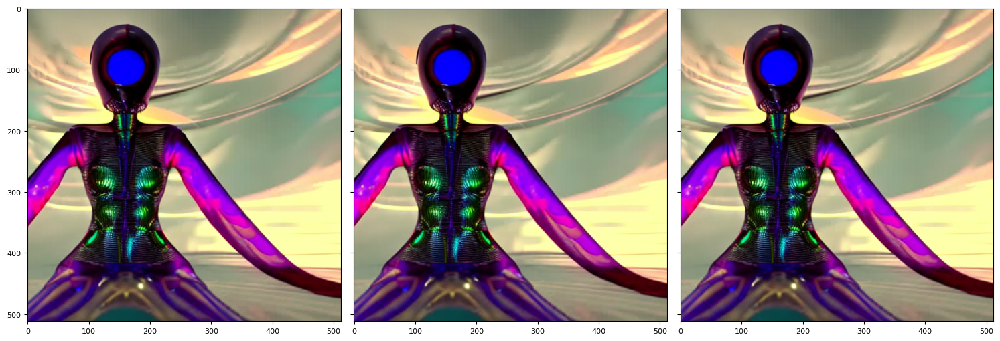

In [24]:
show_images_compare(sample_ids[i])
i += 1

Prompt: vdeo game height map, top down view

Prompt Length = 35



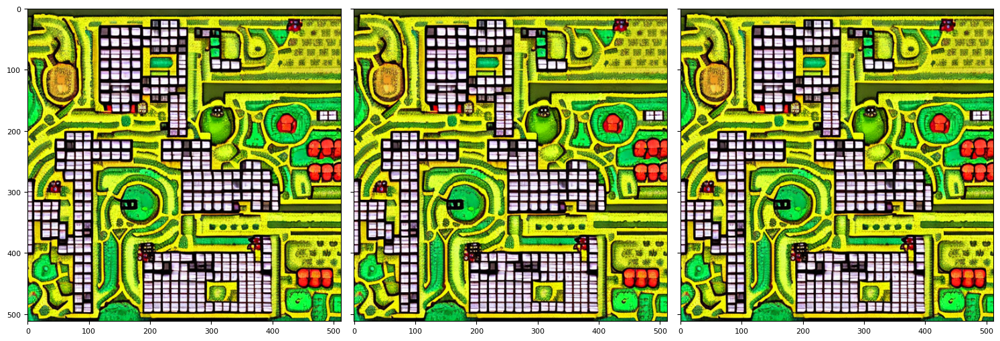

In [25]:
show_images_compare(sample_ids[i])
i += 1

Prompt: digital art of a clear! transparent! liquid! anthro fox person made entirely of clear transparent liquid water, walking in a forest, dripping, splashing, refraction, greg rutkowski 

Prompt Length = 181



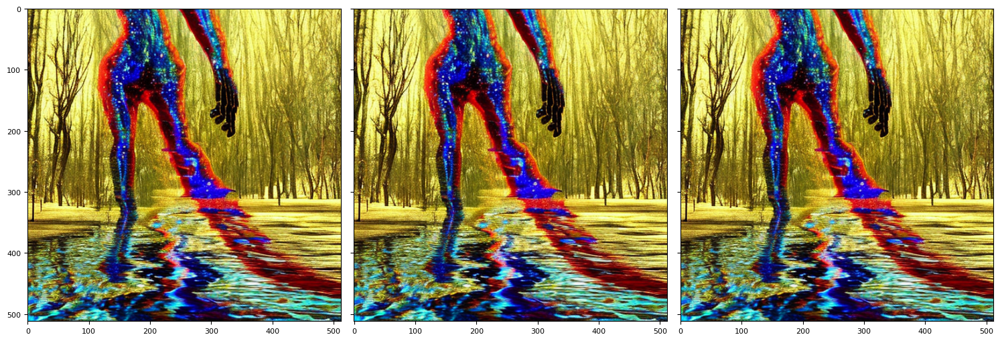

In [26]:
show_images_compare(sample_ids[i])
i += 1

Prompt: portrait of angelic female guardian, vibrant teal and maroon hair, silver armor, strong line, vibrant color, dynamic pose, beautiful! coherent! by frank frazetta, high contrast, minimalism 

Prompt Length = 189



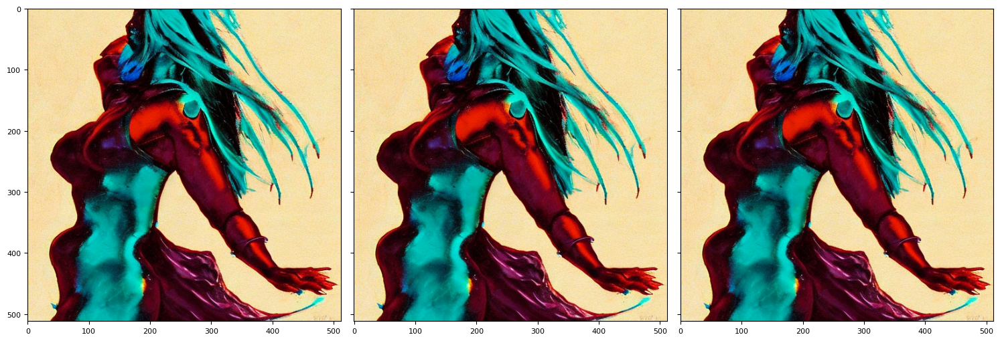

In [27]:
show_images_compare(sample_ids[i])
i += 1

Prompt: a beautiful girl in a dress fluttering in the wind flying across the sky in the style of van gogh's starry night. picture. oil. masterpiece. hd 

Prompt Length = 144



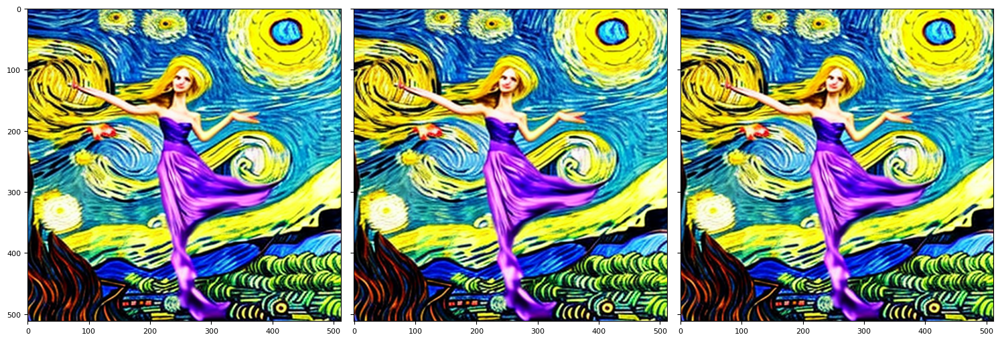

In [28]:
show_images_compare(sample_ids[i])
i += 1

#### Comparison of generated images without ToMe and with ToMe: Visual Inspection

In [29]:
np.random.seed()

In [30]:
sample_ids = np.random.choice(prompts['index'].unique(), 5)
i = 0

Prompt: an angel partially overlapping a demon, fusing in the middle 

Prompt Length = 61



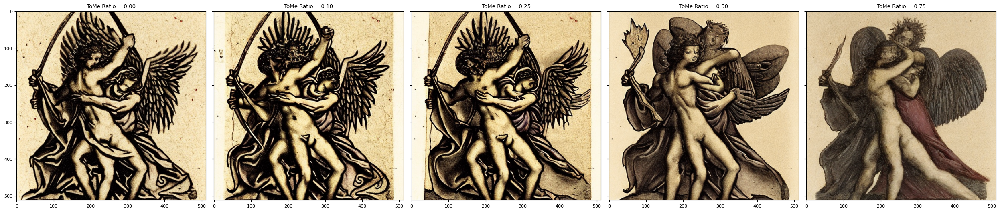

In [31]:
show_images(sample_ids[i])
i += 1

Prompt: The Three Fates weaving the lives of countless souls, artist is Norman Rockwell,

Prompt Length = 80



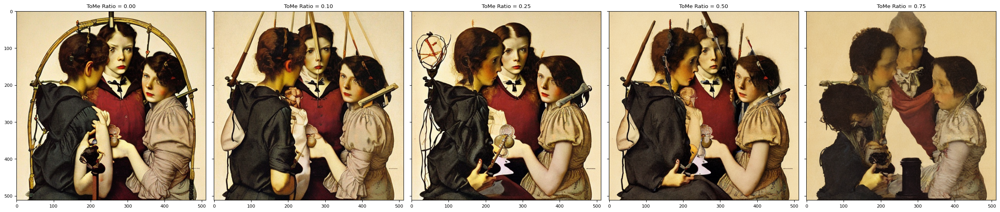

In [32]:
show_images(sample_ids[i])
i += 1

Prompt: The Three Fates weaving the lives of countless souls, artist is Norman Rockwell,

Prompt Length = 80



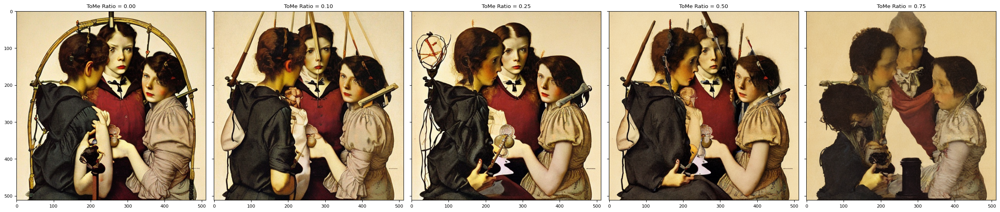

In [33]:
show_images(sample_ids[i])
i += 1

Prompt: rocket jets mech 

Prompt Length = 17



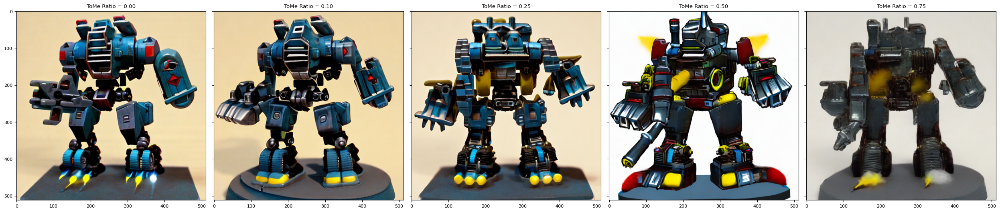

In [34]:
show_images(sample_ids[i])
i += 1

Prompt: sunrise, in fields, mountains, violet and blue color schemes, misty, rainy, cold, dramatic, movie like scenery, trending on artstation, digital art, 4k

Prompt Length = 151



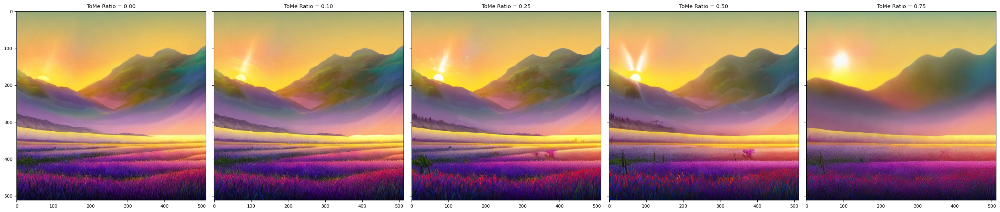

In [35]:
show_images(sample_ids[i])
i += 1

**Observation:** The results are quite different at higher levels of Token Merging, especially above 50% of tokens being merged.

## Section: Calculating Distance between Images using MSE

In [36]:
def calc_mse(row):
    img1 = os.path.join(options_base['out_dir'], row['img_name'])
    img2 = os.path.join(options_base['out_dir'], prompts[(prompts['index'] == row['index']) & (prompts['use_ToMe'] == False)]['img_name'].tolist()[0])
    
    return (np.square(plt.imread(img1)*255 - plt.imread(img2)*255)).mean()

In [37]:
prompts_master_w_mse = f"{prompts_master.split('.')[0]}_mse.parquet"

if os.path.exists(prompts_master_w_mse):
    prompts = pd.read_parquet(prompts_master_w_mse)
    print("Loaded file with MSE values from disk")
else:
    prompts['mse'] = prompts.apply(calc_mse, axis = 1)
    prompts.to_parquet(prompts_master_w_mse)

Loaded file with MSE values from disk


## Section: Results

In [38]:
colors = ['b', 'g', 'r', 'c', 'm']

### Checking performance of overall image generation time between different levels of ToMe

In [39]:
prompts.groupby(['use_ToMe', 'ToMe_ratio'])[['gen_time']].describe()

gen_time                                              
                       count       mean       std        min        25%   
use_ToMe ToMe_ratio                                                       
False    0.00          200.0  26.506201  0.920189  25.874403  25.915896  \
True     0.10          200.0  32.395209  1.163804  31.575104  31.667819   
         0.25          200.0  22.468169  0.844901  21.867044  21.941808   
         0.50          200.0  18.437361  0.720051  17.931746  17.981409   
         0.75          200.0  16.204178  0.634267  15.736128  15.797053   

                                                      
                           50%        75%        max  
use_ToMe ToMe_ratio                                   
False    0.00        25.947554  26.793228  28.376060  
True     0.10        31.701507  32.768387  34.788378  
         0.25        21.976823  22.979821  26.408688  
         0.50        18.008167  18.825562  19.878249  
         0.75        15.824671  16.494584  17.482221

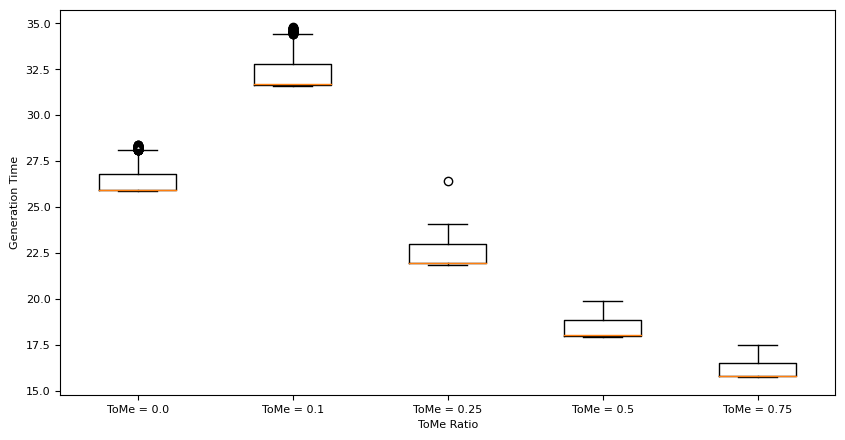

In [40]:
# Change in generation time based on ToMe ratio
fig, axis = plt.subplots(1, 1, figsize = (10, 5))

axis.boxplot(
    [
        prompts[prompts['ToMe_ratio'] == t]['gen_time'] for t in tome_ratio_l
    ]
    
)

axis.set_xticklabels([f'ToMe = {t}' for t in tome_ratio_l])
axis.set_xlabel('ToMe Ratio')
axis.set_ylabel('Generation Time')

plt.show()

**Observation:** Generation Time shows significant drop at higher levels of Token Merging.

#### Impact of Length of Prompt on Generation Time

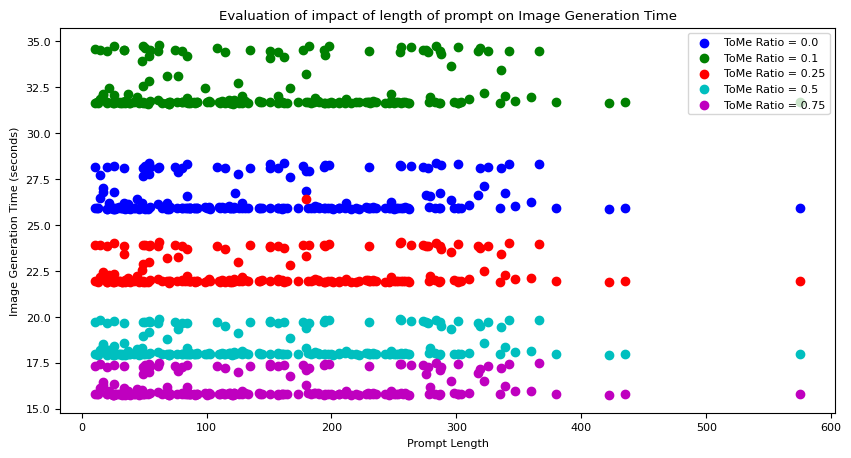

In [41]:
# Relationship between prompt length and ToMe Generation Time
fig, axis = plt.subplots(1, 1, figsize = (10, 5))

for i, t in enumerate(tome_ratio_l):
    p = prompts[prompts['ToMe_ratio'] == t]
    axis.scatter(p['len'], p['gen_time'], c = colors[i], label = f'ToMe Ratio = {t:.02}')
axis.set_xlabel('Prompt Length')
axis.set_ylabel('Image Generation Time (seconds)')

axis.legend()

axis.set_title('Evaluation of impact of length of prompt on Image Generation Time')

plt.show()

**Observation:** Length of prompt does not have any impact on generation time.

### Checking distance of ToMe generated images from baseline images at different levels of ToMe

In [42]:
prompts.groupby(['use_ToMe', 'ToMe_ratio'])[['mse']].describe()

mse                                                      
                     count         mean          std         min          25%   
use_ToMe ToMe_ratio                                                             
False    0.00        200.0     0.000000     0.000000    0.000000     0.000000  \
True     0.10        200.0  1081.192505  1488.219971   23.646467   226.040813   
         0.25        200.0  1582.695801  1599.464600   48.347355   459.884293   
         0.50        200.0  2203.256104  1850.205444  125.865051   827.774384   
         0.75        200.0  2478.476318  1849.571411  247.819214  1126.950439   

                                                             
                             50%          75%           max  
use_ToMe ToMe_ratio                                          
False    0.00           0.000000     0.000000      0.000000  
True     0.10         574.481201  1206.018585  10895.383789  
         0.25        1048.296753  2064.423340   9520.012695  
         0.50        1658.028931  2811.621887  10271.250000  
         0.75        2001.469727  3185.970703  10468.125977

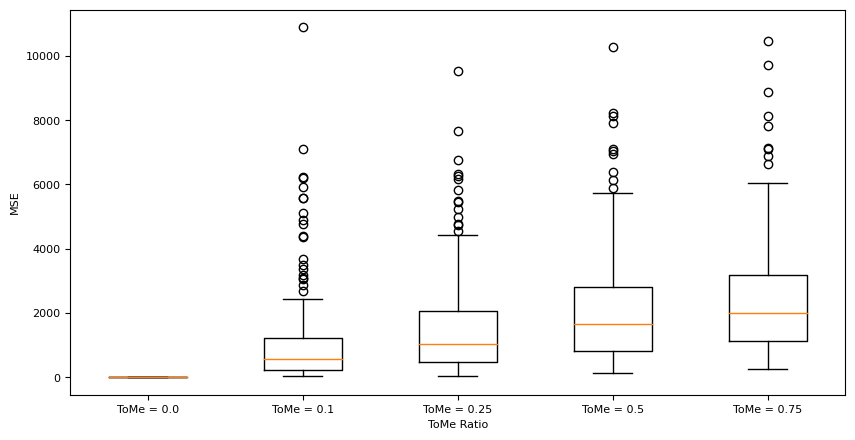

In [43]:
# Change in generation time based on ToMe ratio
fig, axis = plt.subplots(1, 1, figsize = (10, 5))

axis.boxplot(
    [
        prompts[(prompts['ToMe_ratio'] == t)]['mse'] for t in tome_ratio_l
    ]
    
)

axis.set_xticklabels([f'ToMe = {t}' for t in tome_ratio_l])
axis.set_xlabel('ToMe Ratio')
axis.set_ylabel('MSE')

plt.show()

**Observation:** MSE increases with increase in ToMe ratio - At higher ToMe ratios, we observe higher deviations from Baseline image.

### Attempts at seeing if complexity of prompts have an impact on MSE

#### Prompt Complexity: Length of Prompt

In [44]:
bins = 5
prompts['Len_Bin'], len_bins = pd.cut(prompts['len'], bins, labels = range(bins), retbins = True)

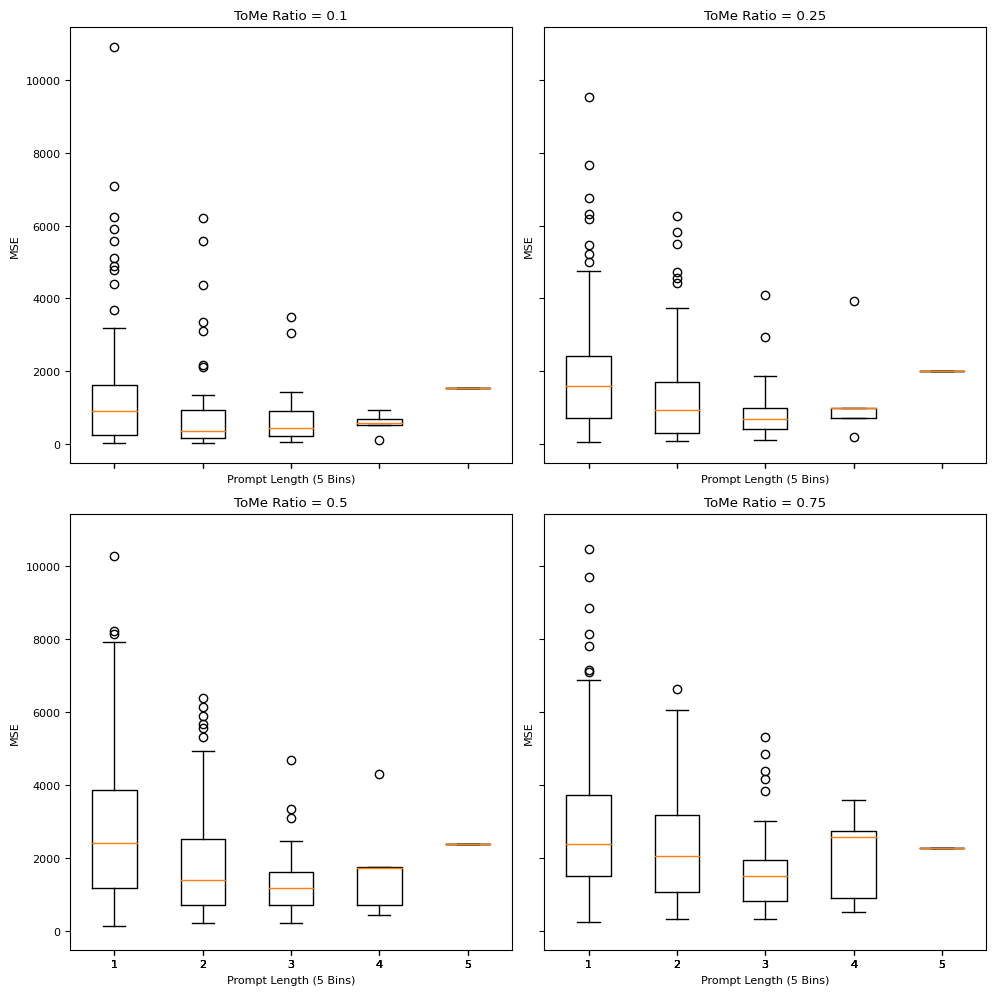

In [45]:
# MSE based on ToMe ratio and relationship with prompt length
fig, axis = plt.subplots(2, 2, figsize = (10, 10), sharex = True, sharey = True)
axis = axis.ravel()

for i, t in enumerate(tome_ratio_l):
    if i == 0:
        continue
    p = prompts[prompts['ToMe_ratio'] == t]
    
    axis[i-1].boxplot(
        [
            p[(p['Len_Bin'] == l)]['mse'] for l in sorted(prompts['Len_Bin'].unique())
        ]

    )
    
    axis[i-1].set_title(f'ToMe Ratio = {t:.02}')
    axis[i-1].set_xlabel(f'Prompt Length ({bins} Bins)')
    axis[i-1].set_ylabel('MSE')

plt.tight_layout()
plt.show()

#### Prompt Complexity: Nr of Nouns

In [46]:
def get_similarity_mean(row):
    # get all nouns in the sentence
    if row['use_ToMe']:
        return None
    nouns = [t.text for t in [t for t in nlp(row['prompt'])] if t.tag_ in ['NN', 'NNS']]
    if len(nouns) <= 1:
        return 0.0
    sim = []
    for a, b in combinations(nouns, 2):
        sim.append(nlp(a).similarity(nlp(b)))
        
    avg = sum(sim) / len(sim)
    
    return avg

In [47]:
prompts_master_w_mse_w_spacy = f"{prompts_master.split('.')[0]}_mse_spacy.parquet"

nlp = None

if os.path.exists(prompts_master_w_mse_w_spacy):
    prompts = pd.read_parquet(prompts_master_w_mse_w_spacy)
    print("Loaded file with MSE values from disk")
else:
    if nlp is None:
        nlp = spacy.load("en_core_web_lg")
    prompts['Nr_Nouns'] = prompts.apply(lambda row: sum([t.tag_ in ['NN', 'NNS'] for t in nlp(row['prompt'])]), axis=1)
    prompts['Noun_Similarity'] = prompts.apply(get_similarity_mean, axis=1)
    prompts['Noun_Similarity'].fillna(method = 'bfill', inplace=True)
    prompts.to_parquet(prompts_master_w_mse_w_spacy)

Loaded file with MSE values from disk


In [48]:
prompts['Noun_Similarity'].fillna(method = 'bfill', inplace=True)
prompts.to_parquet(prompts_master_w_mse_w_spacy)

In [49]:
bins = 5
prompts['Nr_Nouns_Bin'], nr_nouns_bins = pd.cut(prompts['Nr_Nouns'], bins, labels = range(bins), retbins = True)

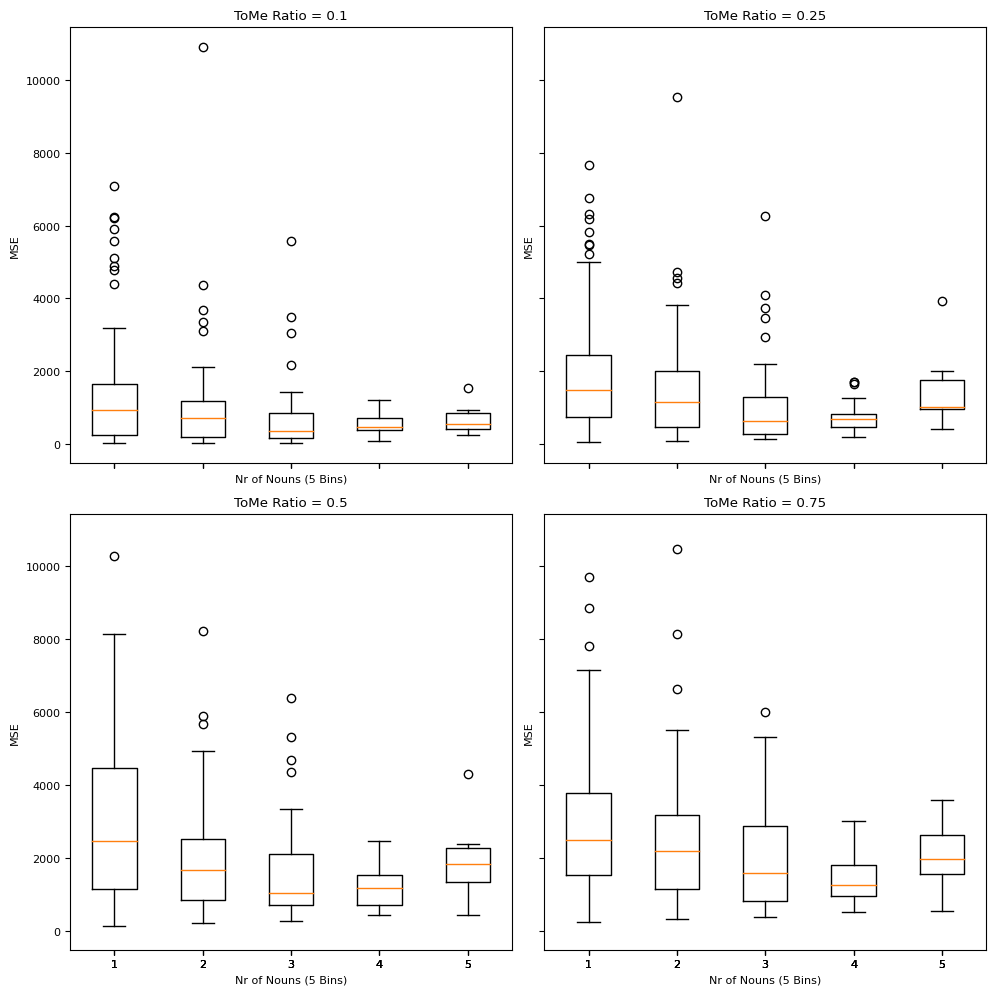

In [50]:
# MSE based on ToMe ratio and relationship with prompt length
fig, axis = plt.subplots(2, 2, figsize = (10, 10), sharex = True, sharey = True)
axis = axis.ravel()

for i, t in enumerate(tome_ratio_l):
    if i == 0:
        continue
    p = prompts[prompts['ToMe_ratio'] == t]
    
    axis[i-1].boxplot(
        [
            p[(p['Nr_Nouns_Bin'] == l)]['mse'] for l in sorted(prompts['Nr_Nouns_Bin'].unique())
        ]

    )
    
    axis[i-1].set_title(f'ToMe Ratio = {t:.02}')
    axis[i-1].set_xlabel(f'Nr of Nouns ({bins} Bins)')
    axis[i-1].set_ylabel('MSE')

plt.tight_layout()
plt.show()

#### Prompt Complexity: Similarity Between Nouns

In [51]:
bins = 5
prompts['Noun_Similarity_Bin'] = pd.cut(prompts['Noun_Similarity'], bins, labels = range(bins))

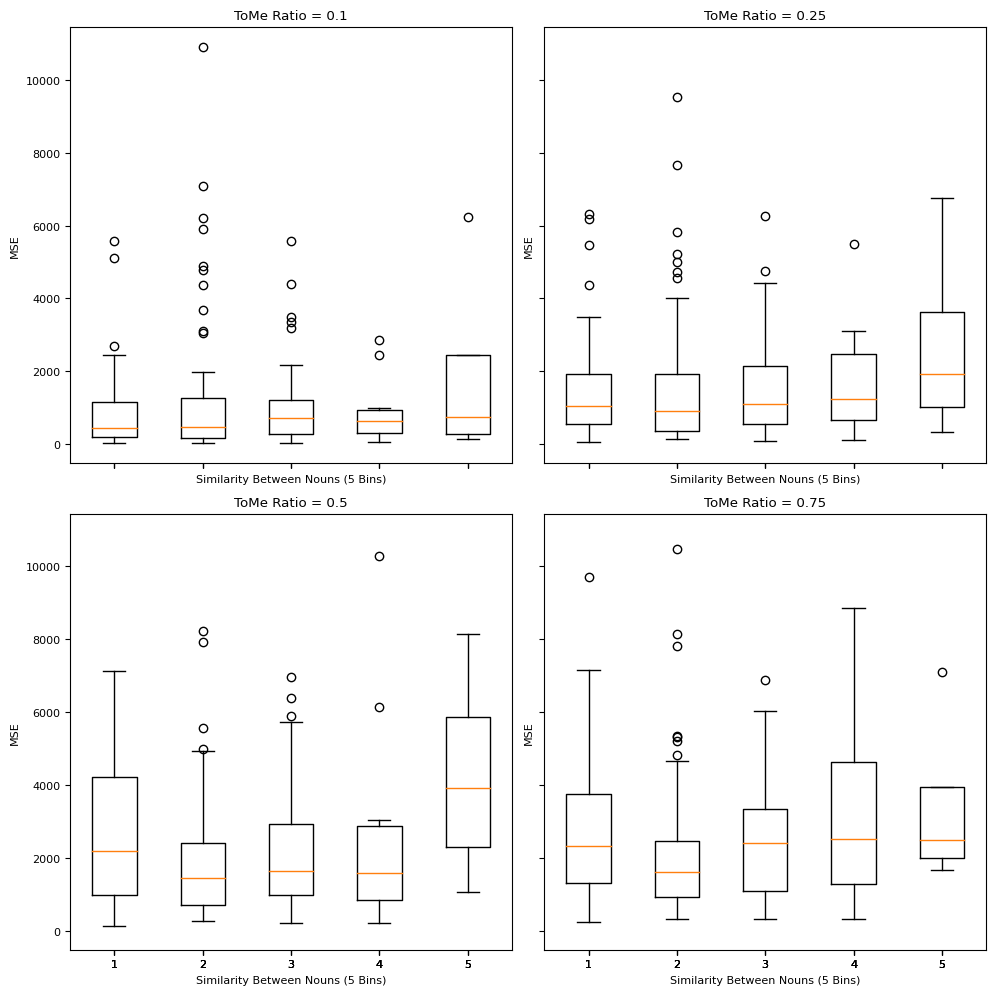

In [52]:
# MSE based on ToMe ratio and relationship with prompt length
fig, axis = plt.subplots(2, 2, figsize = (10, 10), sharex = True, sharey = True)
axis = axis.ravel()

for i, t in enumerate(tome_ratio_l):
    if i == 0:
        continue
    p = prompts[prompts['ToMe_ratio'] == t]
    
    axis[i-1].boxplot(
        [
            p[(p['Noun_Similarity_Bin'] == l)]['mse'] for l in sorted(prompts['Noun_Similarity_Bin'].unique())
        ]

    )
    
    axis[i-1].set_title(f'ToMe Ratio = {t:.02}')
    axis[i-1].set_xlabel(f'Similarity Between Nouns ({bins} Bins)')
    axis[i-1].set_ylabel('MSE')

plt.tight_layout()
plt.show()

In [53]:
# del model

In [54]:
# gc.collect()
# torch.cuda.empty_cache()

In [55]:
# torch.cuda.memory_allocated()

___
___
___
**END OF PROJECT**
___
___
___